# NFL Capstone EDA

I will be using SQL to create dataframes of the various tables and combinations to perform EDA

## Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sqlite3
import os
import sys

## Connect to Database and create dataframes of each table to combine later

In [2]:
conn = sqlite3.connect('..//data//NFLstats.db')

In [3]:
teamyearsummarySQL_Query = pd.read_sql_query("SELECT * FROM 'teamyearsummary'", conn)
teamyearsummary = pd.DataFrame(teamyearsummarySQL_Query)
del teamyearsummary['id']

In [4]:
weeksSQL_Query = pd.read_sql_query("SELECT * FROM 'weeks'", conn)
weeks = pd.DataFrame(weeksSQL_Query)
del weeks['id']

In [5]:
draftSQL_Query = pd.read_sql_query("SELECT * FROM 'draft'", conn)
draft = pd.DataFrame(draftSQL_Query)
#drop drafted special teams players only 78/4595 drafted players with 3 positions
draft = draft[draft.DraftPosition != 'ST']
del draft['id']

In [6]:
startersSQL_Query = pd.read_sql_query("SELECT * FROM 'starters'", conn)
starters = pd.DataFrame(startersSQL_Query)
#Removal of whitespace in 'Starting Player'
starters['StartingPlayer'] = starters['StartingPlayer'].str.strip()
del starters['id']

In [7]:
starters.head()

,Team,Year,StartingPlayer,StartingPlayerAge,StartingPosition,StartingPlayerYrs,StartingPlayerGS
0,Arizona Cardinals,2002,Jake Plummer,1974,QB,5,16
1,Arizona Cardinals,2002,Thomas Jones,1978,RB,2,9
2,Arizona Cardinals,2002,Jason McAddley,1979,WR,0,8
3,Arizona Cardinals,2002,Frank Sanders,1973,WR,7,12
4,Arizona Cardinals,2002,Steve Bush,1974,TE,5,12


## Additional features added to starters df

In [8]:
#Create column of the number of years as a starter for that team
# This cell designates the players first year
# Have to filter by player and age because when scraping data, I had to go piece-wise, and did not generate unique playerid
starters['YrsTeamStarter'] = int(0)

for player in starters['StartingPlayer'].unique():
    for age in set(starters[(starters['StartingPlayer']==player)]['StartingPlayerAge']):
        firstyear = starters[(starters['StartingPlayer']==player) & (starters['StartingPlayerAge']==age)]['Year'].idxmin()
        starters.loc[firstyear, 'YrsTeamStarter'] = int(1)

In [9]:
#Loop through player and year, if it is player's first year, add team to list of teams and add 1 to counter
# if not first year, but team is in list, add another year as a starter to the YrsTeamStarter column
# if not first year, but team is not in team list, this is a new team, and years as starter is back to 1
for player in starters['StartingPlayer'].unique():
    for age in set(starters[(starters['StartingPlayer']==player)]['StartingPlayerAge']):
        teamyear = []
        yrscount = 0
        for year in starters[(starters['StartingPlayer']==player) & (starters['StartingPlayerAge']==age)]['Year'].sort_values().unique():
            mask = starters[(starters['StartingPlayer']==player) & (starters['StartingPlayerAge']==age) &(starters['Year']==year)].index
            if starters.loc[mask, 'YrsTeamStarter'].iloc[-1] == 1:
                yrscount = 1
                teamyear.extend(starters.loc[mask,'Team'])
                #print(player, year, teamyear, starters.loc[mask, 'YrsTeamStarter'].iloc[-1], '1')
                continue
            elif starters.loc[mask,'Team'].iloc[-1] in teamyear:
                yrscount += 1
                starters.loc[mask, 'YrsTeamStarter'] = yrscount
                teamyear.extend(starters.loc[mask,'Team'])
                #print(player, year, teamyear, starters.loc[mask, 'YrsTeamStarter'].iloc[-1], '2')
                continue
            elif starters.loc[mask,'Team'].iloc[-1] not in teamyear:
                starters.at[mask, 'YrsTeamStarter'] = 1
                teamyear.extend(starters.loc[mask,'Team'])
                #print(player, year, teamyear, starters.loc[mask, 'YrsTeamStarter'].iloc[-1], '3')
                continue
            else:
                pass

## Import data from nfldata github repository and prepare to combine with scraped data

In [10]:
roster = pd.read_csv('https://raw.githubusercontent.com/leesharpe/nfldata/master/data/rosters.csv')
nfldatateam = pd.read_csv('https://raw.githubusercontent.com/leesharpe/nfldata/master/data/teams.csv')

In [11]:
#remove duplicates and account for team name changes of 4 teams
#ex original SD --> San Diego Chargers new SD --> Los Angeles Chargers 
#allows for merge with my scraped data
teamdf = nfldatateam[['team', 'full']].drop_duplicates()
teamdf.iloc[31, 1] = 'Washington Football Team'
teamdf.iloc[28, 1] = 'Los Angeles Rams'
teamdf.iloc[25, 1] = 'Los Angeles Chargers'
teamdf.iloc[22, 1] = 'Las Vegas Raiders'
teamdf.set_index('team')

,full
team,
ARI,Arizona Cardinals
ATL,Atlanta Falcons
BAL,Baltimore Ravens
BUF,Buffalo Bills
CAR,Carolina Panthers
CHI,Chicago Bears
CIN,Cincinnati Bengals
CLE,Cleveland Browns
DAL,Dallas Cowboys


In [12]:
#merge teamdf to roster to allow for merge on full team name from scraped data
roster = pd.merge(left=roster, right=teamdf, how='left', on='team')
roster.rename(columns={'full': 'Team','season':'Year', 'full_name':'StartingPlayer', 'av':'AV'}, inplace=True)
#Remove Duplicates 
roster = roster[['Year', 'StartingPlayer', 'AV', 'Team']]
#remove instances where av is na
roster = roster[roster['AV'].notna()]
roster.drop_duplicates(inplace=True)

### Joining of Approximate Value per player per year to starters.  The AV's purpose is as defined, "The approximations are intended only to distinguish as quickly and reliably as possible between large contributions, very large contributions, gigantic contributions, medium-sized contributions, small, smaller, and negligible contributions." 

https://www.pro-football-reference.com/blog/index6b92.html?p=465

In [13]:
starters.head()

,Team,Year,StartingPlayer,StartingPlayerAge,StartingPosition,StartingPlayerYrs,StartingPlayerGS,YrsTeamStarter
0,Arizona Cardinals,2002,Jake Plummer,1974,QB,5,16,1
1,Arizona Cardinals,2002,Thomas Jones,1978,RB,2,9,1
2,Arizona Cardinals,2002,Jason McAddley,1979,WR,0,8,1
3,Arizona Cardinals,2002,Frank Sanders,1973,WR,7,12,1
4,Arizona Cardinals,2002,Steve Bush,1974,TE,5,12,1


In [14]:
roster.head()

,Year,StartingPlayer,AV,Team
0,2006,Matt Leinart,8.0,Arizona Cardinals
1,2006,Jonathan Lewis,0.0,Arizona Cardinals
2,2006,Chris Liwienski,4.0,Arizona Cardinals
3,2006,J.J. Arrington,2.0,Arizona Cardinals
4,2006,Deuce Lutui,5.0,Arizona Cardinals


In [15]:
starters = pd.merge(left=starters, right=roster, how='left', on=['StartingPlayer','Year', 'Team'])

In [16]:
starters

,Team,Year,StartingPlayer,StartingPlayerAge,StartingPosition,StartingPlayerYrs,StartingPlayerGS,YrsTeamStarter,AV
0,Arizona Cardinals,2002,Jake Plummer,1974,QB,5,16,1,NaN
1,Arizona Cardinals,2002,Thomas Jones,1978,RB,2,9,1,NaN
2,Arizona Cardinals,2002,Jason McAddley,1979,WR,0,8,1,NaN
3,Arizona Cardinals,2002,Frank Sanders,1973,WR,7,12,1,NaN
4,Arizona Cardinals,2002,Steve Bush,1974,TE,5,12,1,NaN
...,...,...,...,...,...,...,...,...,...
12649,Tennessee Titans,2018,Brian Orakpo,1986,LB,9,13,7,7.0
12650,Tennessee Titans,2018,Logan Ryan,1991,DB,5,14,3,6.0
12651,Tennessee Titans,2018,Adoree' Jackson,1995,DB,1,13,2,6.0
12652,Tennessee Titans,2018,Kenny Vaccaro,1991,DB,5,13,1,6.0


## Statistics of each table

In [17]:
teamyearsummary.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,576.0,2010.500000,5.192637,2002.0,2006.000,2010.50,2015.000,2019.0
Wins,576.0,7.982639,3.076369,0.0,6.000,8.00,10.000,16.0
Losses,576.0,7.982639,3.075804,0.0,6.000,8.00,10.000,16.0
MoV,576.0,-0.002083,6.288559,-16.3,-4.700,0.10,4.525,19.7
SoS,576.0,0.001389,1.655210,-4.6,-1.100,0.00,1.200,4.3
SRS,576.0,0.000868,6.228220,-17.4,-4.500,-0.10,4.625,20.1
SRS_Off,576.0,-0.000347,4.366421,-11.7,-3.200,0.00,2.800,15.9
SRS_Def,576.0,-0.001562,3.518510,-9.2,-2.325,0.00,2.500,9.8
Team_PF,576.0,352.782986,70.997733,168.0,300.750,354.00,399.000,606.0
Team_Total_Yards,576.0,5389.659722,625.460414,3572.0,4976.750,5402.50,5818.250,7474.0


In [18]:
weeks.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,9612.0,2010.500000,5.188397,2002.0,2006.0,2010.5,2015.0,2019.0
Week_Points_Scored,9612.0,22.099771,10.284595,0.0,14.0,21.0,29.0,62.0
Week_Points_Allowed,9612.0,22.099771,10.284595,0.0,14.0,21.0,29.0,62.0
Week_First_Downs,9612.0,19.313670,5.032361,3.0,16.0,19.0,23.0,40.0
Week_Total_Off_Yards,9612.0,337.307532,85.470544,26.0,279.0,337.0,395.0,653.0
Week_Pass_Yards,9612.0,223.501769,78.556118,-7.0,168.0,219.0,275.0,522.0
Week_Rush_Yards,9612.0,113.805764,51.625187,-18.0,77.0,107.0,144.0,378.0
Week_Off_Turnovers,9612.0,1.595922,1.342601,0.0,1.0,1.0,2.0,8.0
Week_Def_First_Downs,9612.0,19.313670,5.032361,3.0,16.0,19.0,23.0,40.0
Week_Def_Total_Yards,9612.0,337.319913,85.465070,26.0,279.0,337.0,395.0,653.0


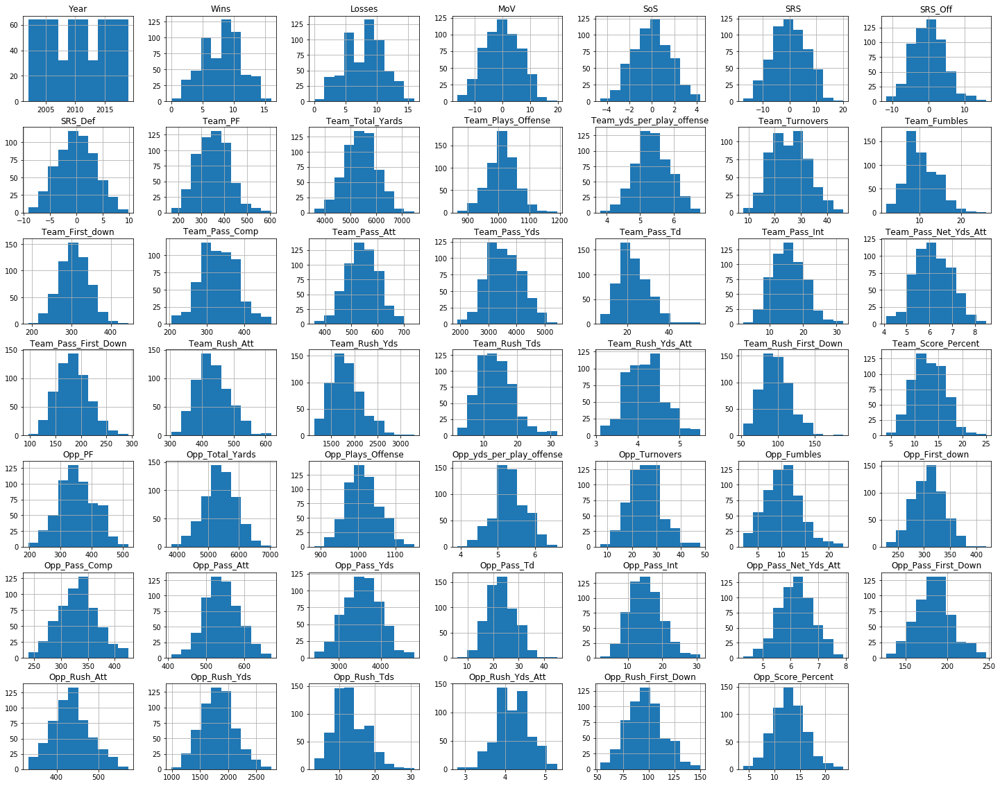

In [19]:
teamyearsummary.hist(bins=10, figsize=(25,20))
plt.show()

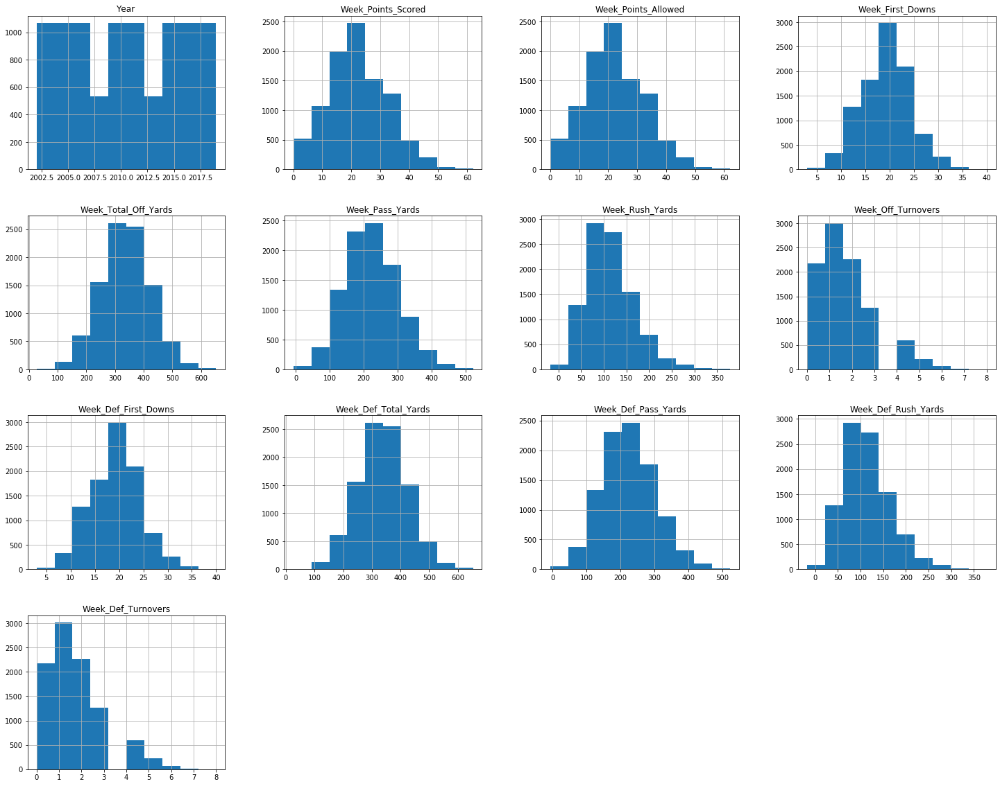

In [20]:
weeks.hist(bins=10, figsize=(25,20))
plt.show()

### What is more correlated with the play selection of pass vs. run on offense, the team, head coach, offensive coordinator or offensive scheme?

In [21]:
def correlation_ratio(categories, measurements):
    fcat, _ = pd.factorize(categories)
    cat_num = np.max(fcat)+1
    y_avg_array = np.zeros(cat_num)
    n_array = np.zeros(cat_num)
    for i in range(0,cat_num):
        cat_measures = measurements[np.argwhere(fcat == i).flatten()]
        n_array[i] = len(cat_measures)
        y_avg_array[i] = np.average(cat_measures)
    y_total_avg = np.sum(np.multiply(y_avg_array,n_array))/np.sum(n_array)
    numerator = np.sum(np.multiply(n_array,np.power(np.subtract(y_avg_array,y_total_avg),2)))
    denominator = np.sum(np.power(np.subtract(measurements,y_total_avg),2))
    if numerator == 0:
        eta = 0.0
    else:
        eta = np.sqrt(numerator/denominator)
    return eta

In [22]:
coachcategories = teamyearsummary['coach']

In [23]:
measurements = teamyearsummary['Team_Pass_Att'] / teamyearsummary['Team_Rush_Att']

In [24]:
correlation_ratio(coachcategories, measurements)

0.6593252555250383

In [25]:
offcoorcategories = teamyearsummary['offcoor']

In [26]:
correlation_ratio(offcoorcategories, measurements)

0.6166873801011822

In [27]:
teamcategories = teamyearsummary['Team']

In [28]:
correlation_ratio(teamcategories, measurements)

0.4418207167202797

In [29]:
offschemecategories = teamyearsummary['offscheme']

In [30]:
correlation_ratio(offschemecategories, measurements)

0.15518600252020634

### It seems that the head coach is most likely to correlate with the pass/run ratio

## Using a correlation module that incorporates categorical and numerical features, what features correlate the most?

### Article where correlation ratio function and dython packages were found here and installed from the documentation

https://towardsdatascience.com/the-search-for-categorical-correlation-a1cf7f1888c9

http://shakedzy.xyz/dython/

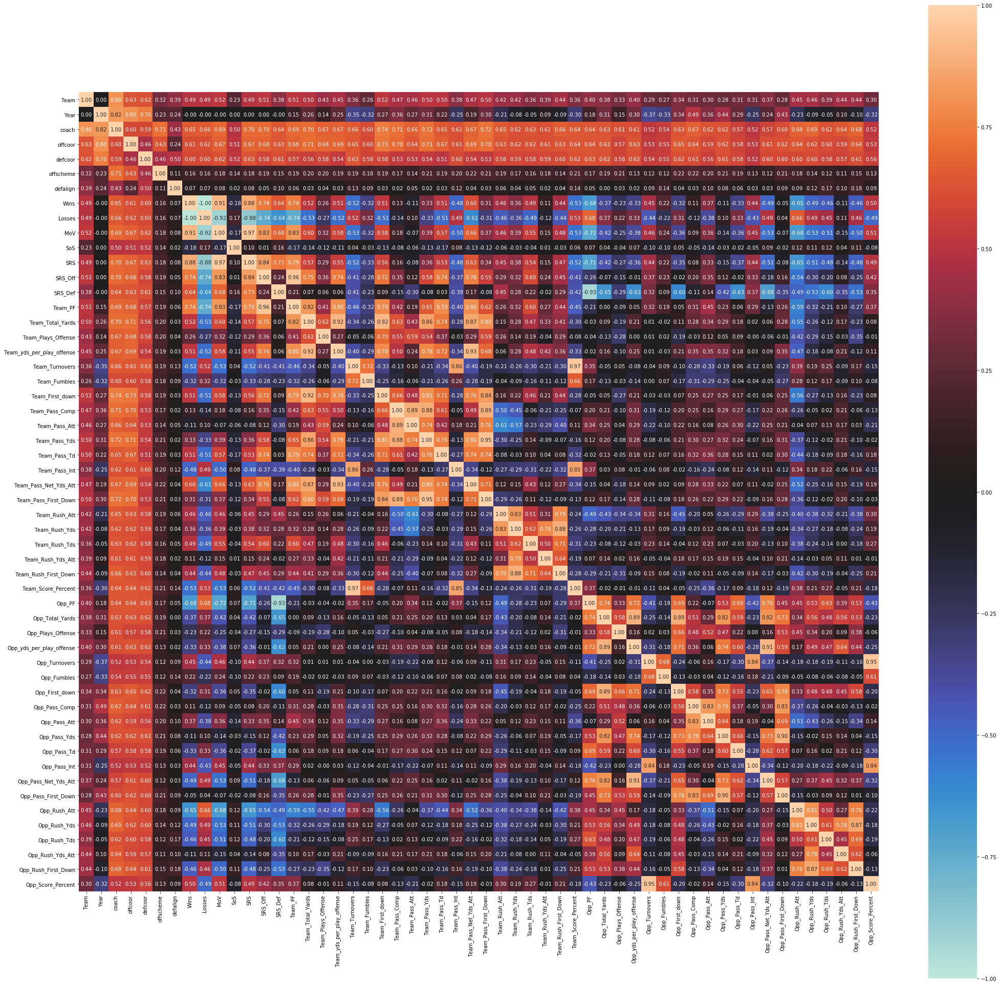

{'corr':                                Team      Year     coach   offcoor   defcoor  \
 Team                       1.000000  0.000000  0.804875  0.626320  0.623754   
 Year                       0.000000  1.000000  0.823169  0.799657  0.756913   
 coach                      0.804875  0.823169  1.000000  0.597024  0.594195   
 offcoor                    0.626320  0.799657  0.597024  1.000000  0.456095   
 defcoor                    0.623754  0.756913  0.594195  0.456095  1.000000   
 offscheme                  0.322169  0.227979  0.713992  0.626143  0.455902   
 defalign                   0.394538  0.239106  0.427923  0.238643  0.499625   
 Wins                       0.493223 -0.003375  0.654102  0.614084  0.596776   
 Losses                     0.493458 -0.003376  0.655927  0.616093  0.598358   
 MoV                        0.517736 -0.000218  0.689406  0.671607  0.621254   
 SoS                        0.227171  0.000223  0.498028  0.514981  0.519029   
 SRS                        0.49

In [31]:
from dython.nominal import associations
associations(teamyearsummary, figsize=(35,35))

### How similar is the correlation between the team year summary and team week breakdown?

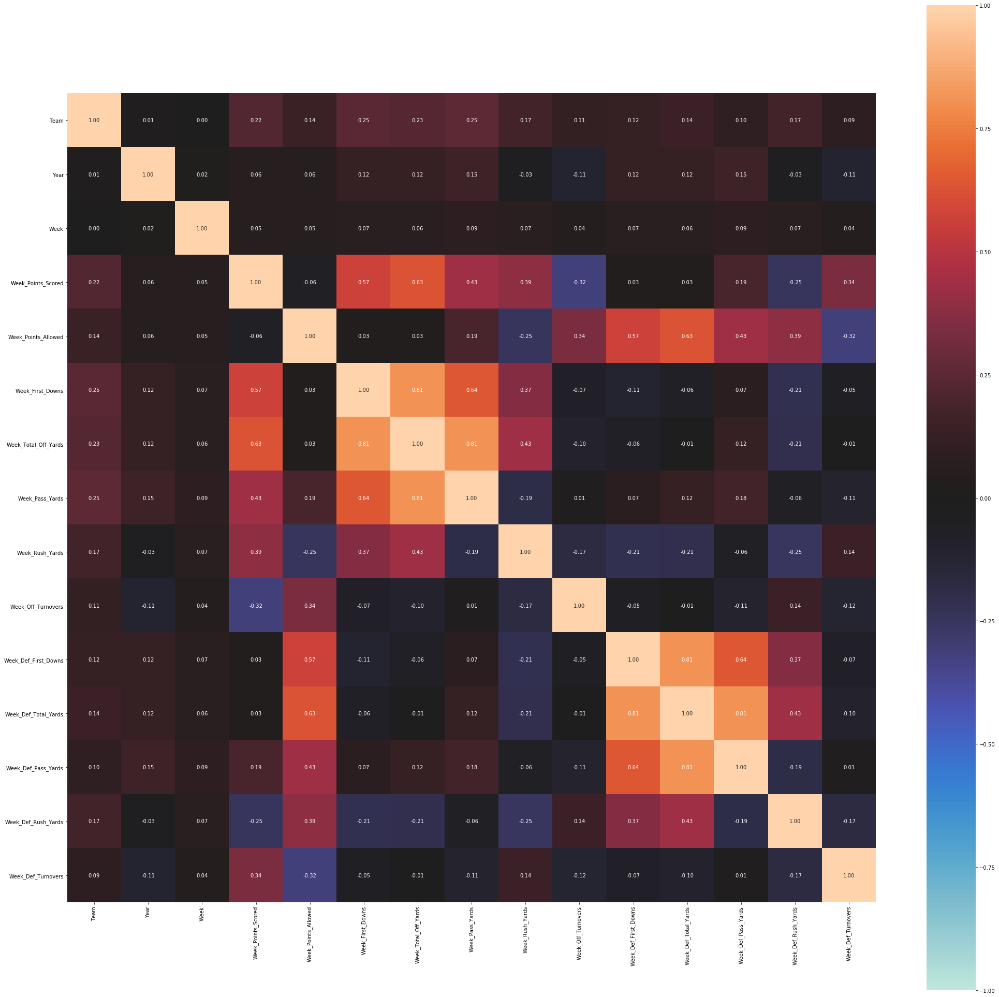

{'corr':                           Team      Year      Week  Week_Points_Scored  \
 Team                  1.000000  0.014263  0.000000            0.220480   
 Year                  0.014263  1.000000  0.022417            0.061025   
 Week                  0.000000  0.022417  1.000000            0.052099   
 Week_Points_Scored    0.220480  0.061025  0.052099            1.000000   
 Week_Points_Allowed   0.137198  0.061025  0.052099           -0.055698   
 Week_First_Downs      0.245147  0.124832  0.069251            0.565034   
 Week_Total_Off_Yards  0.226741  0.117775  0.063704            0.628679   
 Week_Pass_Yards       0.252159  0.148667  0.092213            0.429995   
 Week_Rush_Yards       0.168718 -0.031233  0.065031            0.386532   
 Week_Off_Turnovers    0.113402 -0.113578  0.040594           -0.316024   
 Week_Def_First_Downs  0.123424  0.124832  0.069251            0.034562   
 Week_Def_Total_Yards  0.142083  0.117915  0.063823            0.025585   
 Week_Def_Pass_Ya

In [32]:
associations(weeks, figsize=(35,35))

## What is the count of position types per round from 2002-2019

Text(0, 0.5, 'Position Pick Count')

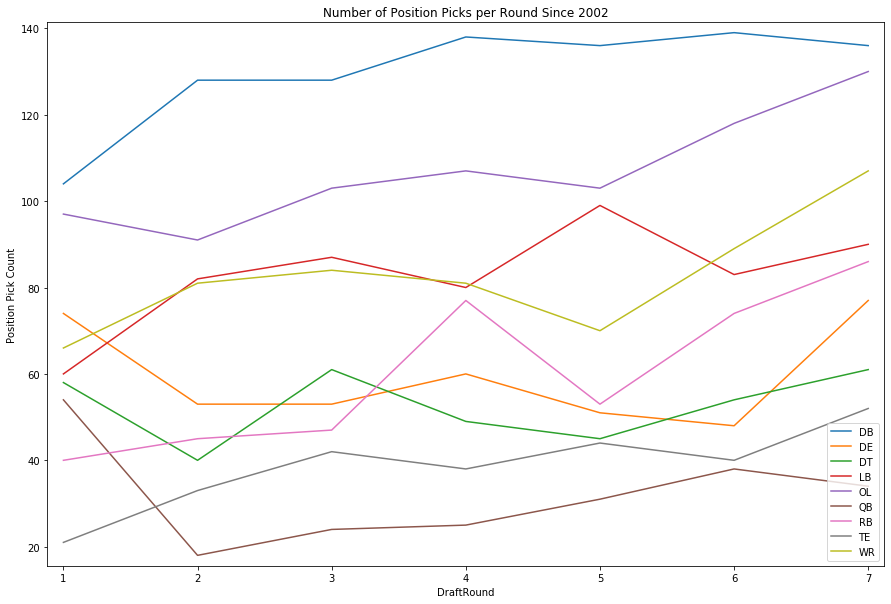

In [33]:
roundPosition = draft.groupby(['DraftRound', 'DraftPosition'])['DraftPlayer'].count().unstack().plot(figsize=(15,10))
plt.legend(loc='lower right')
plt.margins(0.02)
plt.title('Number of Position Picks per Round Since 2002')
plt.ylabel('Position Pick Count')

In [34]:
teamgroupeddraft = draft.groupby(['Team','DraftRound', 'DraftPosition'])['DraftPlayer'].count().unstack()

In [35]:
teamgroupeddraft

DraftPosition                         DB   DE   DT   LB   OL   QB   RB   TE  \
Team                     DraftRound                                           
Arizona Cardinals        1           4.0  1.0  3.0  1.0  3.0  3.0  1.0  NaN   
                         2           2.0  2.0  1.0  5.0  1.0  NaN  2.0  1.0   
                         3           5.0  3.0  1.0  3.0  1.0  1.0  1.0  2.0   
                         4           1.0  4.0  3.0  NaN  6.0  1.0  1.0  NaN   
                         5           2.0  4.0  NaN  2.0  4.0  1.0  4.0  NaN   
...                                  ...  ...  ...  ...  ...  ...  ...  ...   
Washington Football Team 3           4.0  NaN  NaN  NaN  6.0  NaN  1.0  2.0   
                         4           5.0  NaN  NaN  2.0  2.0  1.0  4.0  NaN   
                         5           2.0  1.0  3.0  5.0  2.0  NaN  1.0  3.0   
                         6           5.0  NaN  1.0  4.0  4.0  3.0  4.0  NaN   
                         7           8.0  4.0  1.0  2.0  6.0  1.0  5.0  2.0   

DraftPosition                         WR  
Team                     DraftRound       
Arizona Cardinals        1           3.0  
                         2           3.0  
                         3           4.0  
                         4           1.0  
                         5           3.0  
...                                  ...  
Washington Football Team 3           3.0  
                         4           1.0  
                         5           2.0  
                         6           4.0  
                         7           3.0  

[224 rows x 9 columns]

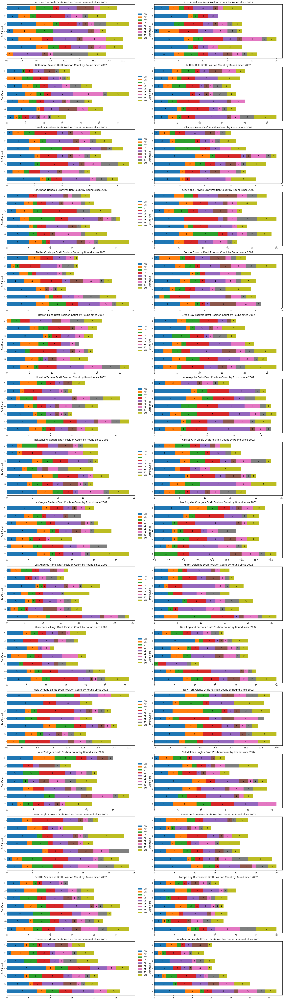

In [36]:
fig, axes = plt.subplots(16,2,figsize=(20,70))
for idx, team in enumerate(teamgroupeddraft.index.get_level_values(0).unique()):
        ax = teamgroupeddraft.loc[team].plot(kind='barh', stacked=True, figsize=(20,70), ax=axes.flatten()[idx])
        for p in ax.patches:
            left, bottom, width, height = p.get_bbox().bounds
            if width > 0:
                ax.annotate(str(int(width)), xy=(left+width/2, bottom+height/2), ha='center', va='center')
            else:
                pass
        ax.set_title(team + ' Draft Position Count by Round since 2002')
        ax.invert_yaxis()
        #plt.ylabel('Count')
        plt.tight_layout()
        if (idx+1)%2 == 0:
            ax.legend(frameon=False, bbox_to_anchor=(-.05,.85), loc='best', borderaxespad=0.)
        else:
            ax.legend('', frameon=False)

### How many players were selected in each position by year?

Text(0, 0.5, 'Position Pick Count')

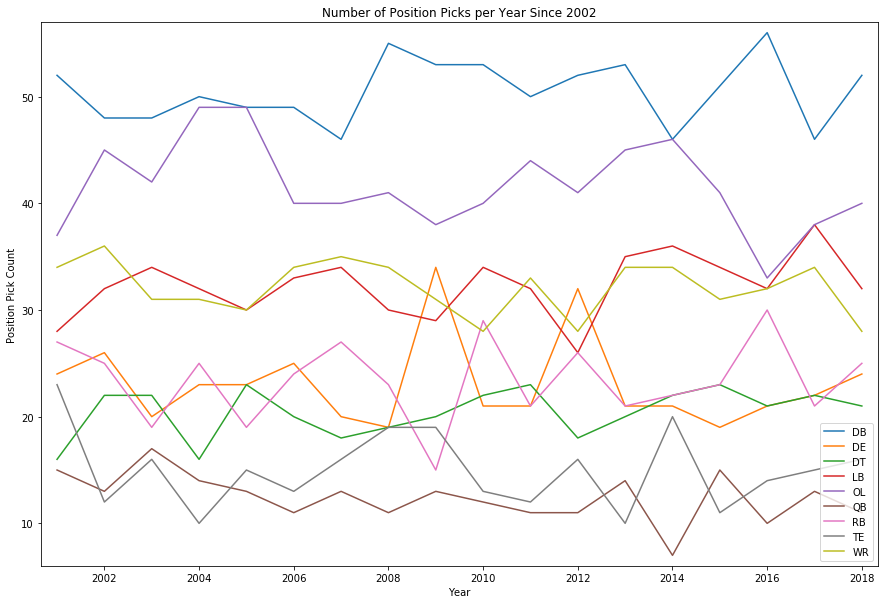

In [37]:
draft.groupby(['Year', 'DraftPosition'])['DraftPlayer'].count().unstack().plot(figsize=(15,10))
plt.legend(loc='lower right')
plt.margins(0.02)
plt.title('Number of Position Picks per Year Since 2002')
plt.ylabel('Position Pick Count')

What is the average number of years started by position, as well as the average games started by position by year

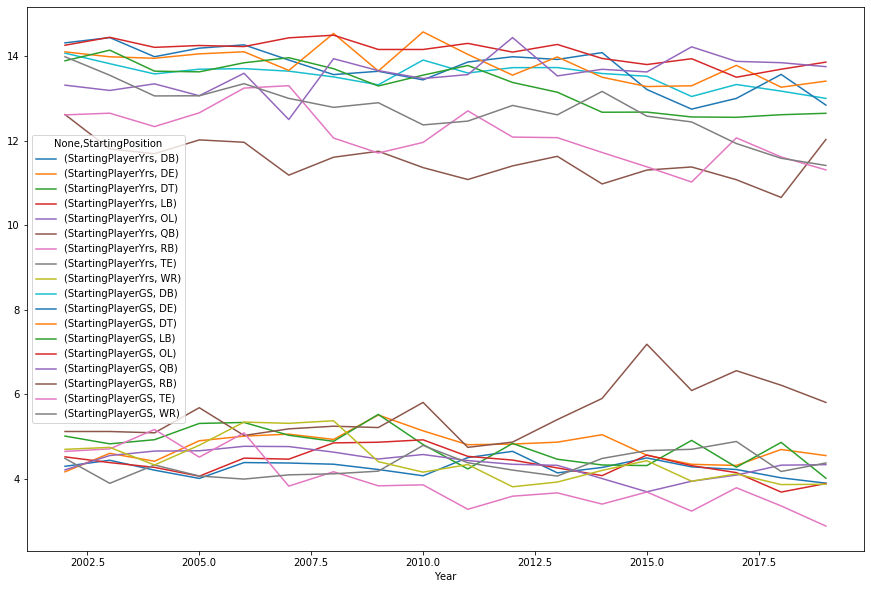

In [40]:
starters.groupby(['Year', 'StartingPosition'])['StartingPlayerYrs', 'StartingPlayerGS'].mean().unstack().plot(figsize=(15,10))

### Confirmation with this webpage that the groupby is what I wanted - https://www.pro-football-reference.com/draft/draft-totals.htm

In [41]:
draft.groupby(['Year', 'DraftPosition']).count()

Team  DraftRound  DraftPick  DraftPlayer  DraftSchool  \
Year DraftPosition                                                          
2001 DB               52          52         52           52           52   
     DE               24          24         24           24           24   
     DT               16          16         16           16           16   
     LB               28          28         28           28           28   
     OL               37          37         37           37           37   
...                  ...         ...        ...          ...          ...   
2018 OL               40          40         40           40           40   
     QB               11          11         11           11           11   
     RB               25          25         25           25           25   
     TE               16          16         16           16           16   
     WR               28          28         28           28           28   

                    DraftTeamSelection  
Year DraftPosition                      
2001 DB                             52  
     DE                             24  
     DT                             16  
     LB                             28  
     OL                             37  
...                                ...  
2018 OL                             40  
     QB                             11  
     RB                             25  
     TE                             16  
     WR                             28  

[162 rows x 6 columns]

### Grouping team, year, and Starting Position and grouping on avg. starting years and avg. starting games started

Unstacking the multiindex and then concatenating on the teamyearsummary dataframe.  

Grouping Draft position by team and year on the team selection order

Doing all of this to see if there are any larger correlations between the teamyearsummary, starter information, and then how the draft is picked by team by year

In [42]:
starters.columns

Index(['Team', 'Year', 'StartingPlayer', 'StartingPlayerAge',
       'StartingPosition', 'StartingPlayerYrs', 'StartingPlayerGS',
       'YrsTeamStarter', 'AV'],
      dtype='object')

In [43]:
starters.isnull().sum()

Team                    0
Year                    0
StartingPlayer          0
StartingPlayerAge       0
StartingPosition        0
StartingPlayerYrs       0
StartingPlayerGS        0
YrsTeamStarter          0
AV                   3623
dtype: int64

In [44]:
startergroup = starters.groupby(['Team', 'Year', 'StartingPosition'])['StartingPlayerYrs', 'StartingPlayerGS', 'AV'].mean().unstack()

In [45]:
startergroup = startergroup.reset_index()

### Flattening multiindex to concat dataframes

In [46]:
startergroup.columns = startergroup.columns.map('{0[0]}{0[1]}'.format)

In [47]:
startergroup

,Team,Year,StartingPlayerYrsDB,StartingPlayerYrsDE,StartingPlayerYrsDT,StartingPlayerYrsLB,StartingPlayerYrsOL,StartingPlayerYrsQB,StartingPlayerYrsRB,StartingPlayerYrsTE,...,StartingPlayerGSWR,AVDB,AVDE,AVDT,AVLB,AVOL,AVQB,AVRB,AVTE,AVWR
0,Arizona Cardinals,2002,3.50,1.0,4.0,5.333333,3.4,5.0,2.0,5.0,...,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arizona Cardinals,2003,2.75,0.5,3.0,3.666667,4.4,11.0,3.0,6.0,...,13.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arizona Cardinals,2004,3.25,6.0,2.5,5.000000,2.8,2.0,14.0,7.0,...,12.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arizona Cardinals,2005,7.00,7.0,2.5,4.333333,2.8,7.0,4.0,0.5,...,15.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arizona Cardinals,2006,4.75,8.0,4.0,3.333333,2.6,0.0,7.0,5.0,...,12.333333,5.25,5.5,5.5,5.666667,6.4,8.0,8.0,0.0,8.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
571,Washington Football Team,2015,5.25,7.5,6.0,3.250000,2.0,3.0,3.0,2.5,...,12.500000,5.00,6.5,7.0,6.250000,8.2,12.0,4.0,4.5,5.000000
572,Washington Football Team,2016,5.00,7.0,7.0,3.500000,3.4,4.0,0.0,6.5,...,15.500000,4.00,5.5,6.0,8.000000,9.0,15.0,5.0,5.5,9.000000
573,Washington Football Team,2017,3.50,4.0,8.0,3.750000,3.8,5.0,0.0,8.5,...,10.000000,5.25,5.0,6.0,7.250000,6.2,12.0,5.0,3.0,5.000000
574,Washington Football Team,2018,4.00,1.5,0.0,5.750000,4.8,13.0,11.0,5.0,...,8.666667,5.25,6.5,8.0,8.250000,5.2,6.0,7.0,4.0,3.000000


## Target Dataframes
Target features- Draft Pick Position/ Draft Team Selection

1. teamyearsummary + starters + draft 
#removeAV
AVcols = ['AVDB', 'AVDE', 'AVDT', 'AVLB', 'AVOL', 'AVQB', 'AVRB', 'AVTE', 'AVWR']
teamstarterdraft
2. teamyearsummary + startersAV + draft(2006-2018 limitation of AV data)
teamstarterdraft

3. week summary + starters + draft
4. week summary + startersAV + draft(2006-2018 limitation of AV data)


Models to try
(perform lasso Regression to see if coach/def align etc are important features)

1. Regression
    1. Ridge
    2. Random Forest Regression
    3. XGBoost
2. Classification
    1. Random Forest
    2. Gradient Boosting
    3. XGBoost



In [48]:
draftpositionselection = draft[['Team', 'Year', 'DraftPosition','DraftTeamSelection']]

### teamyearsummary + starters + draft

In [49]:
teamyearstarter = pd.merge(teamyearsummary, startergroup, how='inner', on=['Team', 'Year'])
teamstarterdraft = pd.merge(teamyearstarter, draftpositionselection, how='inner', on=['Team', 'Year'])
AVcols =  ['AVDB', 'AVDE', 'AVDT', 'AVLB', 'AVOL', 'AVQB', 'AVRB', 'AVTE', 'AVWR']
teamstarterdraft.drop(columns=AVcols, inplace=True)
teamstarterdraft.to_csv('teamstarterdraft.csv', index=False)

### teamyearsummary + startersAV + draft (2006-2018 limitation of AV data)

In [50]:
teamyearstarterAV = pd.merge(teamyearsummary, startergroup, how='inner', on=['Team', 'Year'])
teamstarterdraftAV = pd.merge(teamyearstarter, draftpositionselection, how='inner', on=['Team', 'Year'])
#Remove data from years that do not have AV
teamstarterdraftAV.dropna(inplace=True)
teamstarterdraftAV.to_csv('teamstarterdraftAV.csv', index=False)

### week + starters + draft

In [ ]:
weekstarter = pd.merge(weeks, startergroup, how='inner', on=['Team', 'Year'])
weekstarterdraft = pd.merge(weekstarter, draftpositionselection, how='inner', on=['Team', 'Year'])
weekstarterdraft.drop(columns=AVcols, inplace=True)
weekstarterdraft.to_csv('weekstarterdraft.csv', index=False)

### week + startersAV + draft(2006-2018 limitation of AV data)

In [ ]:
weekstarterAV = pd.merge(weeks, startergroup, how='inner', on=['Team', 'Year'])
weekstarterdraftAV = pd.merge(weekstarterAV, draftpositionselection, how='inner', on=['Team', 'Year'])
#Remove data from years that do not have AV
weekstarterdraftAV.dropna(inplace=True)
weekstarterdraftAV.to_csv('weekstarterdraftAV.csv', index=False)

## Are there any glaring correlations with our target features?

In [51]:
from dython.nominal import compute_associations

In [54]:
teamstarterdraftcorr = compute_associations(teamstarterdraft, clustering=True)

In [52]:
teamstarterdraftcorrAV = compute_associations(teamstarterdraftAV, clustering=True)

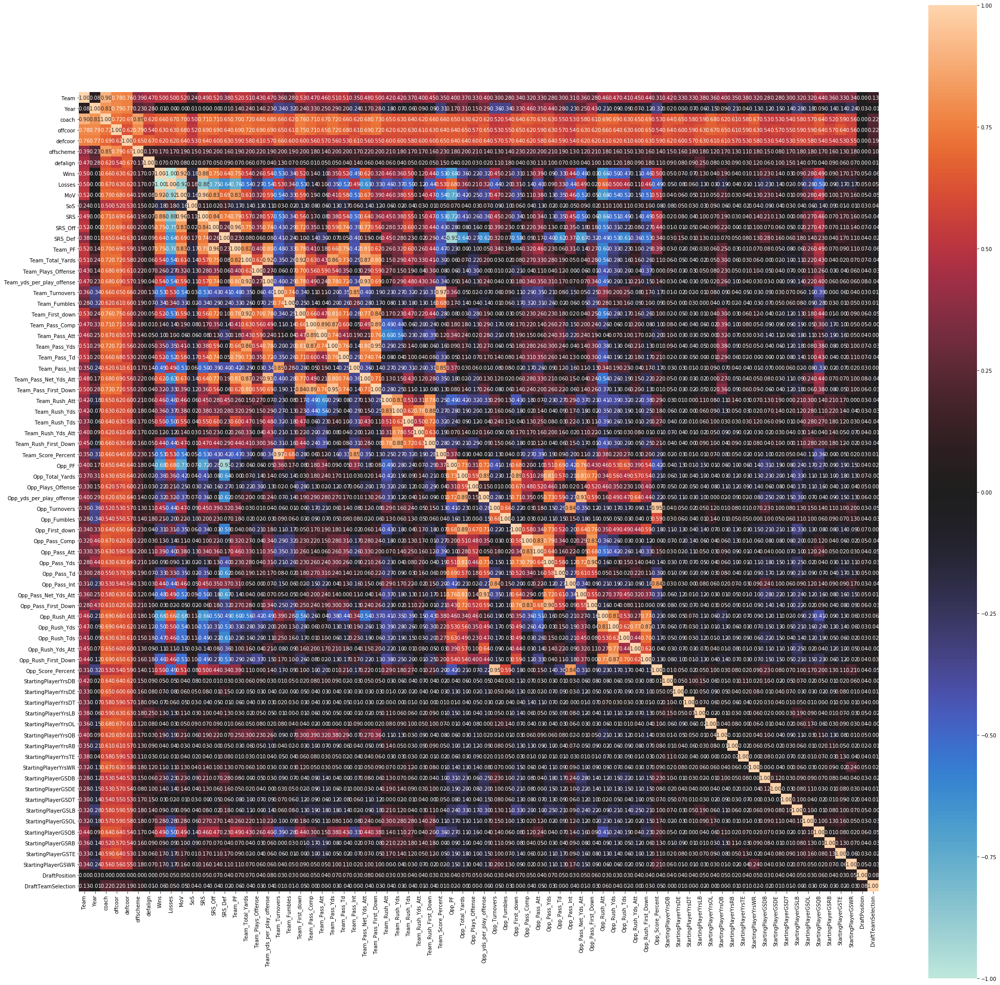

{'corr':                         Team      Year     coach   offcoor   defcoor  \
 Team                1.000000  0.077381  0.899880  0.776841  0.759189   
 Year                0.077381  1.000000  0.812707  0.785473  0.765122   
 coach               0.899880  0.812707  1.000000  0.719723  0.687097   
 offcoor             0.776841  0.785473  0.719723  1.000000  0.624414   
 defcoor             0.759189  0.765122  0.687097  0.624414  1.000000   
 ...                      ...       ...       ...       ...       ...   
 StartingPlayerGSRB  0.362447 -0.137134  0.516434  0.570379  0.537700   
 StartingPlayerGSTE  0.331417 -0.140612  0.586864  0.637232  0.528053   
 StartingPlayerGSWR  0.343078 -0.236552  0.559143  0.562843  0.545345   
 DraftPosition       0.000000  0.029666  0.000000  0.000000  0.000000   
 DraftTeamSelection  0.130443 -0.011912  0.219192  0.215252  0.191012   
 
                     offscheme  defalign      Wins    Losses       MoV  ...  \
 Team                 0.392320  0.4

In [59]:
associations(teamstarterdraft, figsize=(35,35))

In [55]:
teamstarterdraftcorr

,Losses,Team_Pass_Int,Team_Score_Percent,Team_Fumbles,Opp_Rush_Att,Team_Turnovers,Opp_Pass_Net_Yds_Att,Opp_Pass_Td,Opp_Rush_Tds,Opp_First_down,...,Opp_Turnovers,SoS,DraftPosition,SRS_Def,Team_Rush_First_Down,Team_Rush_Yds_Att,Team_Rush_Yds,Team_Rush_Att,StartingPlayerYrsDT,DraftTeamSelection
Losses,1.000000,0.492838,0.533706,0.337870,0.660021,0.529790,0.485661,0.326818,0.462424,0.306632,...,-0.444664,0.177409,0.049813,-0.638329,-0.444343,-0.121869,-0.365241,-0.456000,0.061803,0.054871
Team_Pass_Int,0.492838,1.000000,0.849972,0.277692,0.337360,0.854291,0.114338,0.124514,0.233990,-0.021390,...,-0.079976,0.059752,0.033483,-0.398815,-0.312852,-0.200912,-0.290418,-0.271851,0.005860,0.001125
Team_Score_Percent,0.533706,0.849972,1.000000,0.678415,0.375070,0.965487,0.114736,0.091889,0.267269,-0.067602,...,-0.132849,0.048959,0.027482,-0.417118,-0.284905,-0.185257,-0.270956,-0.253486,0.014284,0.008405
Team_Fumbles,0.337870,0.277692,0.678415,1.000000,0.283663,0.736581,-0.049882,-0.017972,0.158510,-0.173503,...,-0.011351,-0.016687,0.033077,-0.239047,-0.159087,-0.133485,-0.127748,-0.075928,0.032468,0.012515
Opp_Rush_Att,0.660021,0.337360,0.375070,0.283663,1.000000,0.390998,0.271913,0.050030,0.530189,0.346583,...,-0.186352,0.109959,0.033639,-0.486498,-0.426960,-0.145753,-0.349435,-0.410957,0.070222,0.057187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Team_Rush_Yds_Att,-0.121869,-0.200912,-0.185257,-0.133485,-0.145753,-0.213675,0.106344,0.162708,0.027576,0.173453,...,-0.047806,0.025420,0.042349,-0.018787,0.634436,1.000000,0.779040,0.308068,-0.008606,-0.011953
Team_Rush_Yds,-0.365241,-0.290418,-0.270956,-0.127748,-0.349435,-0.273587,-0.175741,-0.085704,-0.191529,-0.179868,...,0.164277,-0.020689,0.033284,0.279076,0.881003,0.779040,1.000000,0.831982,-0.002014,-0.034612
Team_Rush_Att,-0.456000,-0.271851,-0.253486,-0.075928,-0.410957,-0.232476,-0.366721,-0.273324,-0.322297,-0.430119,...,0.294865,-0.057541,0.032628,0.445908,0.784570,0.308068,0.831982,1.000000,0.001361,-0.043897
StartingPlayerYrsDT,0.061803,0.005860,0.014284,0.032468,0.070222,0.021693,0.006541,-0.015850,0.032504,-0.043412,...,-0.020723,0.026440,0.039974,-0.006234,-0.004590,-0.008606,-0.002014,0.001361,1.000000,0.004945


In [56]:
teamstarterdraftcorrAV[['DraftTeamSelection', 'DraftPosition']].sort_values('DraftTeamSelection', ascending=False)

,DraftTeamSelection,DraftPosition
DraftTeamSelection,1.000000,0.091255
offcoor,0.232164,0.000000
coach,0.227733,0.000000
defcoor,0.209952,0.000000
Team,0.148602,0.000000
...,...,...
Team_First_down,-0.063805,0.060626
Team_Total_Yards,-0.064093,0.072463
Team_Pass_Net_Yds_Att,-0.067101,0.072208
Team_Pass_Td,-0.068142,0.071858


In [57]:
teamstarterdraftcorrAV[['DraftTeamSelection', 'DraftPosition']].sort_values('DraftPosition', ascending=False)

,DraftTeamSelection,DraftPosition
DraftPosition,0.091255,1.000000
DraftTeamSelection,1.000000,0.091255
Team_yds_per_play_offense,-0.060438,0.078542
AVQB,-0.055606,0.077174
Opp_Pass_First_Down,-0.037057,0.075561
...,...,...
coach,0.227733,0.000000
defalign,0.013318,0.000000
Team,0.148602,0.000000
offcoor,0.232164,0.000000


In [58]:
teamstarterdraft.columns

Index(['Team', 'Year', 'coach', 'offcoor', 'defcoor', 'offscheme', 'defalign',
       'Wins', 'Losses', 'MoV', 'SoS', 'SRS', 'SRS_Off', 'SRS_Def', 'Team_PF',
       'Team_Total_Yards', 'Team_Plays_Offense', 'Team_yds_per_play_offense',
       'Team_Turnovers', 'Team_Fumbles', 'Team_First_down', 'Team_Pass_Comp',
       'Team_Pass_Att', 'Team_Pass_Yds', 'Team_Pass_Td', 'Team_Pass_Int',
       'Team_Pass_Net_Yds_Att', 'Team_Pass_First_Down', 'Team_Rush_Att',
       'Team_Rush_Yds', 'Team_Rush_Tds', 'Team_Rush_Yds_Att',
       'Team_Rush_First_Down', 'Team_Score_Percent', 'Opp_PF',
       'Opp_Total_Yards', 'Opp_Plays_Offense', 'Opp_yds_per_play_offense',
       'Opp_Turnovers', 'Opp_Fumbles', 'Opp_First_down', 'Opp_Pass_Comp',
       'Opp_Pass_Att', 'Opp_Pass_Yds', 'Opp_Pass_Td', 'Opp_Pass_Int',
       'Opp_Pass_Net_Yds_Att', 'Opp_Pass_First_Down', 'Opp_Rush_Att',
       'Opp_Rush_Yds', 'Opp_Rush_Tds', 'Opp_Rush_Yds_Att',
       'Opp_Rush_First_Down', 'Opp_Score_Percent', 'StartingPlayer